In [1]:
import sys
from pathlib import Path
from typing import Any, Callable

import dotenv
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchmetrics
import torchmetrics.classification
import torchmetrics.segmentation
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import ModelCheckpoint, RichProgressBar
from simplecv.module import fpn
from torch import Tensor

from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3, Tier1, Hold, Test
from inz.util import get_wandb_logger, show_masks_comparison

sys.path.append("inz/farseg")

from inz.farseg.module.farseg import FarSeg
from inz.farseg.module.loss import cosine_annealing, linear_annealing, poly_annealing

In [2]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [3]:
dm = XBDDataModule(
    path=Path("data/xBD_processed"),
    drop_unclassified_channel=True,
    split_events={
        "train": {
            Tier1: [
                Event.guatemala_volcano,
                Event.hurricane_florence,
                Event.hurricane_harvey,
                Event.hurricane_matthew,
                Event.hurricane_michael,
                Event.mexico_earthquake,
                Event.midwest_flooding,
                Event.palu_tsunami,
                Event.santa_rosa_wildfire,
                Event.socal_fire,
            ],
            Tier3: [
                Event.joplin_tornado,
                Event.lower_puna_volcano,
                Event.moore_tornado,
                Event.nepal_flooding,
                Event.pinery_bushfire,
                Event.portugal_wildfire,
                Event.sunda_tsunami,
                Event.tuscaloosa_tornado,
                Event.woolsey_fire,
            ],
            Test: [
                Event.guatemala_volcano,
                Event.hurricane_florence,
                Event.hurricane_harvey,
                Event.hurricane_matthew,
                Event.hurricane_michael,
                Event.mexico_earthquake,
                Event.midwest_flooding,
                Event.palu_tsunami,
                Event.santa_rosa_wildfire,
                Event.socal_fire,
            ]
        },
        "val": {
            Hold: [
                Event.guatemala_volcano,
                Event.hurricane_florence,
                Event.hurricane_harvey,
                Event.hurricane_matthew,
                Event.hurricane_michael,
                Event.mexico_earthquake,
                Event.midwest_flooding,
                Event.palu_tsunami,
                Event.santa_rosa_wildfire,
                Event.socal_fire,
            ]
        }
    },
    train_batch_size=80,
    val_batch_size=80,
    test_batch_size=80,
)
dm.prepare_data()
dm.setup("fit")

print(f"{len(dm.train_dataloader())} train batches, {len(dm.val_dataloader())} val batches")

SyntaxError: invalid syntax. Perhaps you forgot a comma? (854220474.py, line 4)

In [ ]:
config = dict(
    resnet_encoder=dict(
        resnet_type="resnet50",
        include_conv5=True,
        batchnorm_trainable=True,
        pretrained=True,
        freeze_at=0,
        # 8, 16 or 32
        output_stride=32,
        with_cp=(False, False, False, False),
        stem3_3x3=False,
    ),
    fpn=dict(
        in_channels_list=(512, 1024, 2048, 4096),
        # in_channels_list=(256, 512, 1024, 2048),
        out_channels=256,
        conv_block=fpn.default_conv_block,
        top_blocks=None,
    ),
    scene_relation=dict(
        in_channels=4096,
        # in_channels=2048,
        channel_list=(256, 256, 256, 256),
        out_channels=256,
        scale_aware_proj=True,
    ),
    decoder=dict(
        in_channels=256,
        out_channels=128,
        in_feat_output_strides=(4, 8, 16, 32),
        out_feat_output_stride=4,
        norm_fn=nn.BatchNorm2d,
        num_groups_gn=None,
    ),
    num_classes=5,
    loss=dict(
        cls_weight=1.0,
        ignore_index=255,
    ),
    annealing_softmax_focalloss=dict(gamma=2.0, max_step=10000, annealing_type="cosine"),
)

In [ ]:
class DoubleBranchFarSeg(nn.Module):
    def __init__(self, farseg_config: dict, n_classes: int, class_weights: Tensor | None = None):
        super(DoubleBranchFarSeg, self).__init__()
        self.farseg_config = farseg_config
        self.n_classes = n_classes
        self.module = FarSeg(config=farseg_config)
        self.outconv = nn.Conv2d(farseg_config["decoder"]["out_channels"] * 2, n_classes, 1)
        self.class_weights = class_weights

        # replace the loss method, since the original implementation does not allow class weights in cross entropy
        def _softmax_focalloss(y_pred, y_true, ignore_index=255, gamma=2.0, normalize=False):
            """

            Args:
                y_pred: [N, #class, H, W]
                y_true: [N, H, W] from 0 to #class
                gamma: scalar

            Returns:

            """
            losses = F.cross_entropy(y_pred, y_true, weight=class_weights, ignore_index=ignore_index, reduction="none")
            with torch.no_grad():
                p = y_pred.softmax(dim=1)
                modulating_factor = (1 - p).pow(gamma)
                valid_mask = ~y_true.eq(ignore_index)
                masked_y_true = torch.where(valid_mask, y_true, torch.zeros_like(y_true))
                modulating_factor = torch.gather(
                    modulating_factor, dim=1, index=masked_y_true.unsqueeze(dim=1)
                ).squeeze_(dim=1)
                scale = 1.0
                if normalize:
                    scale = losses.sum() / (losses * modulating_factor).sum()
            losses = scale * (losses * modulating_factor).sum() / (valid_mask.sum() + p.size(0))

            return losses

        def _annealing_softmax_focalloss(
            y_pred, y_true, t, t_max, ignore_index=255, gamma=2.0, annealing_function=cosine_annealing
        ):
            losses = F.cross_entropy(
                y_pred,
                y_true,
                weight=class_weights,
                ignore_index=ignore_index,
                reduction="none",
            )
            with torch.no_grad():
                p = y_pred.softmax(dim=1)
                modulating_factor = (1 - p).pow(gamma)
                valid_mask = ~y_true.eq(ignore_index)
                masked_y_true = torch.where(valid_mask, y_true, torch.zeros_like(y_true))
                modulating_factor = torch.gather(
                    modulating_factor, dim=1, index=masked_y_true.unsqueeze(dim=1)
                ).squeeze_(dim=1)
                normalizer = losses.sum() / (losses * modulating_factor).sum()
                scales = modulating_factor * normalizer
            if t > t_max:
                scale = scales
            else:
                scale = annealing_function(1, scales, t, t_max)
            losses = (losses * scale).sum() / (valid_mask.sum() + p.size(0))
            return losses

        def _cls_loss(y_pred, y_true):
            if "softmax_focalloss" in self.module.config:
                return _softmax_focalloss(
                    y_pred,
                    y_true.long(),
                    ignore_index=self.module.config.loss.ignore_index,
                    gamma=self.module.config.softmax_focalloss.gamma,
                    normalize=self.module.config.softmax_focalloss.normalize,
                )
            elif "annealing_softmax_focalloss" in self.module.config:
                func_dict = dict(cosine=cosine_annealing, poly=poly_annealing, linear=linear_annealing)
                return _annealing_softmax_focalloss(
                    y_pred,
                    y_true.long(),
                    self.module.buffer_step.item(),
                    self.module.config.annealing_softmax_focalloss.max_step,
                    self.module.config.loss.ignore_index,
                    self.module.config.annealing_softmax_focalloss.gamma,
                    func_dict[self.module.config.annealing_softmax_focalloss.annealing_type],
                )
            return F.cross_entropy(
                y_pred, y_true.long(), weight=class_weights, ignore_index=self.module.config.loss.ignore_index
            )

        self.module.cls_loss = _cls_loss

    def forward(self, x) -> torch.Tensor:
        feat_list_1 = self.module.en(x[:, :3, ...])
        feat_list_2 = self.module.en(x[:, 3:, ...])
        feat_list = [torch.cat([t1, t2], dim=1) for t1, t2 in zip(feat_list_1, feat_list_2)]
        fpn_feat_list = self.module.fpn(feat_list)
        if "scene_relation" in self.module.config:
            c5 = feat_list[-1]
            c6 = self.module.gap(c5)
            refined_fpn_feat_list = self.module.sr(c6, fpn_feat_list)
        else:
            refined_fpn_feat_list = fpn_feat_list

        final_feat = self.module.decoder(refined_fpn_feat_list)
        cls_pred = self.module.cls_pred_conv(final_feat)
        return self.module.upsample4x_op(cls_pred)

In [ ]:
module = DoubleBranchFarSeg(farseg_config=config, n_classes=5).to(device)

INFO:simplecv.util.logger:ResNetEncoder: pretrained = True


scene_relation: on
loss type: cosine


In [ ]:
dummy_batch = torch.rand((32, 3, 256, 256), dtype=torch.float).to(device)
out = module.forward(torch.cat([dummy_batch, dummy_batch], dim=1))
out.shape

torch.Size([32, 5, 256, 256])

In [ ]:
class DoubleBranchFarSegModule(pl.LightningModule):
    def __init__(
        self,
        model: nn.Module,
        optimizer_factory: Callable[[Any], torch.optim.Optimizer],
        scheduler_factory: Callable[[Any], torch.optim.lr_scheduler.LRScheduler] | None = None,
        class_weights: Tensor | None = None,
    ):
        super(DoubleBranchFarSegModule, self).__init__()
        # n classes
        n_classes = 5
        self.n_classes = n_classes

        self.class_weights = class_weights

        self.save_hyperparameters(ignore=["model", "loss"])

        self.model = model

        self.optimizer_factory = optimizer_factory
        self.scheduler_factory = scheduler_factory

        # metrics
        self.accuracy_loc = torchmetrics.classification.BinaryAccuracy()
        self.iou_loc = torchmetrics.segmentation.MeanIoU(num_classes=2)

        self.f1 = torchmetrics.classification.MulticlassF1Score(num_classes=n_classes)
        self.precision = torchmetrics.classification.MulticlassPrecision(num_classes=n_classes)
        self.recall = torchmetrics.classification.MulticlassRecall(num_classes=n_classes)
        self.iou = torchmetrics.segmentation.MeanIoU(num_classes=n_classes)

        self.f1_per_class = torchmetrics.classification.MulticlassF1Score(num_classes=n_classes, average="none")
        self.precision_per_class = torchmetrics.classification.MulticlassPrecision(
            num_classes=n_classes, average="none"
        )
        self.recall_per_class = torchmetrics.classification.MulticlassRecall(num_classes=n_classes, average="none")
        self.iou_per_class = torchmetrics.segmentation.MeanIoU(num_classes=n_classes, per_class=True)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.model(x)  # type: ignore[no-any-return]

    def loss(
        self, images_pre: Tensor, masks_pre: Tensor, images_post: Tensor, masks_post: Tensor
    ) -> tuple[Tensor, Tensor]:
        preds = self.forward(torch.cat([images_pre, images_post], dim=1))

        loss = self.model.module.config.loss.cls_weight * self.model.module.cls_loss(
            preds, torch.argmax(masks_post, dim=1)
        )
        class_loss = Tensor([0, 0, 0, 0, 0])

        # loss = self.model.module.config.loss.cls_weight * self.model.module.cls_loss(preds, torch.argmax(masks_post, dim=1))
        return loss, class_loss

    def training_step(self, batch: list[Tensor], batch_idx: int) -> Tensor:
        loss, class_loss = self.loss(*batch)

        class_loss_dict = {f"train_loss_{i}": loss_val for i, loss_val in enumerate(class_loss)}
        self.log_dict(class_loss_dict | {"train_loss": loss}, prog_bar=True, batch_size=batch[0].shape[0])
        return loss  # type: ignore[no-any-return]

    def validation_step(self, batch: list[Tensor], batch_idx: int):  # type: ignore[no-untyped-def]
        with torch.no_grad():
            images_pre, _, images_post, masks_post = batch

            cls_preds = self.forward(torch.cat([images_pre, images_post], dim=1))
            cls_preds_masks = F.one_hot(cls_preds.argmax(dim=1), num_classes=self.n_classes).moveaxis(-1, 1)

            loss, class_loss = self.loss(*batch)

            log_dict = (
                {
                    "acc_loc": self.accuracy_loc(
                        cls_preds.argmax(dim=1).gt(0).to(torch.float), masks_post.argmax(dim=1).gt(0).to(torch.float)
                    ),
                    "iou_loc": self.iou_loc(
                        F.one_hot(cls_preds.argmax(dim=1).gt(0).to(torch.long), num_classes=2).moveaxis(-1, 1),
                        F.one_hot(masks_post.argmax(dim=1).gt(0).to(torch.long), num_classes=2).moveaxis(-1, 1),
                    ),
                }
                | {
                    name: getattr(self, name)(cls_preds.argmax(dim=1), masks_post.argmax(dim=1))
                    for name in ["f1", "precision", "recall"]
                }
                | {"iou": self.iou(cls_preds_masks, masks_post.to(torch.uint8))}
                | {
                    f"{name}_{i}": val
                    for name, vec in {
                        name: getattr(self, f"{name}_per_class")(cls_preds.argmax(dim=1), masks_post.argmax(dim=1))
                        for name in ["f1", "precision", "recall"]
                    }.items()
                    for i, val in enumerate(vec)
                }
                | {
                    f"iou_{i}": val
                    for i, val in enumerate(self.iou_per_class(cls_preds_masks, masks_post.to(torch.uint8)))
                }
                | {f"val_loss_{i}": loss_val for i, loss_val in enumerate(class_loss)}
                | {"val_loss": loss}
            )
            self.log_dict(log_dict, prog_bar=True, batch_size=batch[0].shape[0])

            return log_dict

    def configure_optimizers(self):  # type: ignore[no-untyped-def]
        optimizer = self.optimizer_factory(self.model.parameters())
        if self.scheduler_factory:
            scheduler = self.scheduler_factory(optimizer)
            return [optimizer], [scheduler]
        else:
            return optimizer

In [ ]:
# class_weights = None
class_weights = torch.Tensor([1, 1, 9.04788032, 8.68207691, 12.9632271]).to(device)
model = DoubleBranchFarSegModule(
    model=DoubleBranchFarSeg(farseg_config=config, n_classes=5, class_weights=class_weights).to(device),
    class_weights=class_weights,
    optimizer_factory=lambda params: torch.optim.AdamW(params, lr=0.0002, weight_decay=1e-4),
    # optimizer_factory=lambda params: torch.optim.SGD(params, momentum=0.9, weight_decay=1e-4),
    scheduler_factory=lambda optimizer: torch.optim.lr_scheduler.PolynomialLR(
        optimizer=optimizer, power=0.9, total_iters=60000
    ),
).to(device)

INFO:simplecv.util.logger:ResNetEncoder: pretrained = True


scene_relation: on
loss type: cosine


In [ ]:
wandb_logger = get_wandb_logger(run_name="FarSeg test original split")

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: tomasz-owienko-stud (tomasz-owienko-stud-warsaw-university-of-technology). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/tomek/.netrc


In [ ]:
trainer = pl.Trainer(
    max_epochs=50,
    callbacks=[
        RichProgressBar(),
        ModelCheckpoint(
            dirpath="delete_me",
            save_last="link",
            save_top_k=1,
            monitor="epoch",
            mode="max",
            filename="farseg_test_original_split-{epoch:02d}-{step:03d}-{f1:.6f}-last"
        ),
        ModelCheckpoint(
            dirpath="delete_me",
            save_last="link",
            save_top_k=2,
            monitor="f1",
            mode="max",
            filename="farseg_test_original_split-{epoch:02d}-{step:03d}-{f1:.6f}-best-f1"
        ),
        ModelCheckpoint(
            dirpath="delete_me",
            save_last="link",
            save_top_k=2,
            monitor="val_loss",
            mode="min",
            filename="farseg_test_original_split-{epoch:02d}-{step:03d}-{f1:.6f}-best-val-loss"
        )
    ],
    precision="bf16",
    logger=wandb_logger,
)
trainer.fit(model, datamodule=dm)

/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/lightning_fabric/connector.py:563: `precision=bf16` is supported for historical reasons but its usage is discouraged. Please set your precision to bf16-mixed instead!
INFO:pytorch_lightning.utilities.rank_zero:Using bfloat16 Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:44: attribute 'optimizer_factory' removed from hparams because it cannot be pickled
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:44: attribute 'scheduler_factory' removed from hparams because it cannot be pickled
/home/to

┏━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃    ┃ Name                ┃ Type                ┃ Params ┃
┡━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0  │ model               │ DoubleBranchFarSeg  │ 34.5 M │
│ 1  │ accuracy_loc        │ BinaryAccuracy      │      0 │
│ 2  │ iou_loc             │ MeanIoU             │      0 │
│ 3  │ f1                  │ MulticlassF1Score   │      0 │
│ 4  │ precision           │ MulticlassPrecision │      0 │
│ 5  │ recall              │ MulticlassRecall    │      0 │
│ 6  │ iou                 │ MeanIoU             │      0 │
│ 7  │ f1_per_class        │ MulticlassF1Score   │      0 │
│ 8  │ precision_per_class │ MulticlassPrecision │      0 │
│ 9  │ recall_per_class    │ MulticlassRecall    │      0 │
│ 10 │ iou_per_class       │ MeanIoU             │      0 │
└────┴─────────────────────┴─────────────────────┴────────┘

Trainable params: 34.5 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.5 M                                                                                               
Total estimated model params size (MB): 137

Output()

/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of 
training batches (26) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for 
log_every_n_steps if you want to see logs for the training epoch.

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [ ]:
model.eval()

DoubleBranchFarSegModule(
  (model): DoubleBranchFarSeg(
    (module): FarSeg(
      (en): ResNetEncoder(
        (resnet): ResNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
       

In [ ]:
it = iter(dm.val_dataloader())


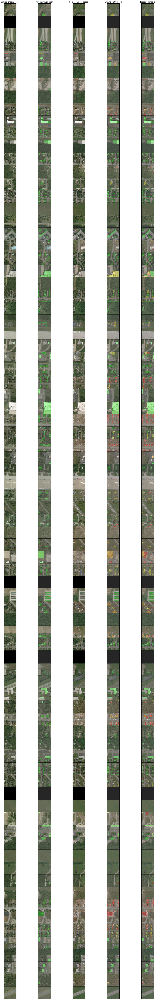

In [ ]:
batch = next(it)
images_pre, masks_pre, images_post, masks_post = batch
with torch.no_grad():
    m = model.to(device)
    preds = m(torch.cat([images_pre, images_post], dim=1).to(device))

plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["figure.figsize"] = [20, 120]

show_masks_comparison(
    images_pre=images_pre, images_post=images_post, masks_pre=masks_pre, masks_post=masks_post, preds=preds, opacity=0.3
)